# Processing data

*  Create new list of upsampled data.  
*  Augment data.  

In [1]:
import json
import numpy as np
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
SEED = 2021
DATA_MULT = 3 # Used to define how many times more we the data to increase
main_path = "dataset/"
train_path = "train.jsonl"
dev_path = "dev_seen.jsonl"
test_path = "test_seen.jsonl"
label_upsample = 1
upsample_data_accronym = "upsampled_"
def get_json_list(filepath):
    # with open(filepath) as f:
    #         json_list = [json.loads(json_dict) for json_dict in f.readlines()]
    json_list = pd.read_json(main_path+filepath, lines=True) 
    return json_list
def display_img(img_id):
    img_path = "dataset/img/"
    img = mpimg.imread(f"{img_path}/{id_to_img(img_id)}")
    imgplot = plt.imshow(img)
    plt.show()
    
def id_to_img(img_id):
    return str(img_id).zfill(5) + ".png"

## Upsample data

Upsample the train dataset by resampling the non-toxic memes with replacement and creating a new .jsonl file with the upsampled data list.

In [2]:
train_data = get_json_list(train_path)
non_upsample = 0 if label_upsample == 1 else 1
label_upsample_data = train_data[train_data['label']==label_upsample]
label_nonupsample_data = train_data[train_data['label']== non_upsample]
len_label =len(label_upsample_data)
print("Label",str(label_upsample),"amount in train data:",len_label,"\nLabel 1 amount in train data:",len(label_nonupsample_data))
#Create an upsample of data by sampling with replacement and reseting index
random_label = label_upsample_data.sample(n=len_label*DATA_MULT,replace=True,random_state=SEED).reset_index(drop=True)
random_label


Label 1 amount in train data: 3019 
Label 1 amount in train data: 5481


,id,img,label,text
0,97845,img/97845.png,1,not all black people are criminals
1,46501,img/46501.png,1,muslims in 2001 defund homeland security! musl...
2,78923,img/78923.png,1,my black boy friend
3,53879,img/53879.png,1,whatcha thinking about? wind speed and directi...
4,60487,img/60487.png,1,imagine a world with no muslims... just imagin...
...,...,...,...,...
9052,69472,img/69472.png,1,they named us after the land mass they shipped...
9053,83509,img/83509.png,1,when a girl says she is lesbian so you become ...
9054,9624,img/09624.png,1,white people already paid reparations
9055,98125,img/98125.png,1,do you hate rapist? and child molesters? and p...


In [3]:
new_dataset = pd.concat([random_label,label_nonupsample_data])
#Shuffle the data and reset index
new_dataset = new_dataset.sample(frac=1,random_state=SEED).reset_index(drop=True)
new_dataset

,id,img,label,text
0,70561,img/70561.png,1,"fuck off!! you muslim bastards, we didn't win ..."
1,5869,img/05869.png,0,my wife asked me where i'd like to be buried a...
2,75438,img/75438.png,0,"over 5,000 years of eating bread and in less t..."
3,89372,img/89372.png,0,2 more sleeps until hunbashing
4,27604,img/27604.png,1,girls are like jelly beans they're all good. e...
...,...,...,...,...
14533,10258,img/10258.png,1,*lands plane successfully as planned * everyon...
14534,1578,img/01578.png,1,sea monkeys
14535,57421,img/57421.png,1,when the squad is about to get lit.
14536,21704,img/21704.png,0,"the ""i'm not black but my kids will be"" face"


In [4]:
save_new_data= main_path+upsample_data_accronym+str(label_upsample)+'_'+train_path
new_dataset.to_json(save_new_data,lines=True,orient='records')

## Duplicated text data

In [5]:
duplicated = train_data['text'].duplicated(keep=False)
duplicated.describe()

count      8500
unique        2
top       False
freq       6034
Name: text, dtype: object

In [6]:

duplicated_text = train_data[duplicated]
unique_amount = duplicated_text['text'].describe()
unique_amount
# duplicated_text['text'].unique()[:20]

count                                 2466
unique                                1038
top       meanwhile at the isis strip club
freq                                    44
Name: text, dtype: object

In [7]:
# txt = 'go be gay somewhere else'
txt = 'obama voters'
txt = 'what does a baby from auschwitz look like?'
txt = 'how to get a black guy to see his baby'
txt = 'meanwhile at the isis strip club'
repeated_txt = train_data[train_data['text']==txt]
repeated_txt

,id,img,label,text
117,20568,img/20568.png,0,meanwhile at the isis strip club
267,35097,img/35097.png,0,meanwhile at the isis strip club
613,97542,img/97542.png,0,meanwhile at the isis strip club
859,91562,img/91562.png,0,meanwhile at the isis strip club
986,2947,img/02947.png,0,meanwhile at the isis strip club
988,94850,img/94850.png,0,meanwhile at the isis strip club
1085,92180,img/92180.png,0,meanwhile at the isis strip club
1202,48136,img/48136.png,0,meanwhile at the isis strip club
1822,69842,img/69842.png,0,meanwhile at the isis strip club
1836,7463,img/07463.png,0,meanwhile at the isis strip club


Label picture below: 0


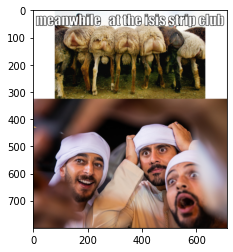

Label picture below: 0


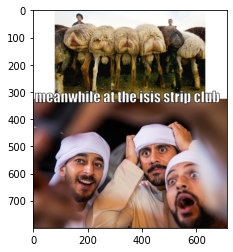

Label picture below: 0


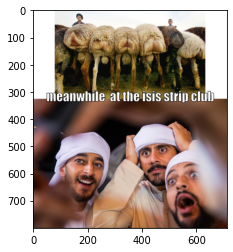

Label picture below: 0


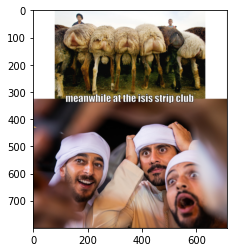

Label picture below: 0


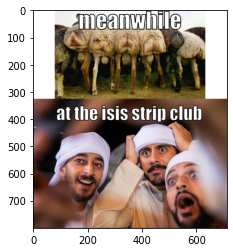

Label picture below: 0


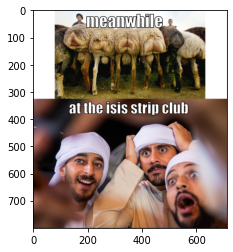

Label picture below: 0


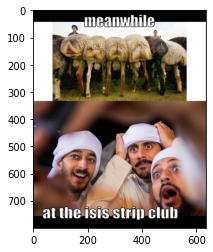

Label picture below: 0


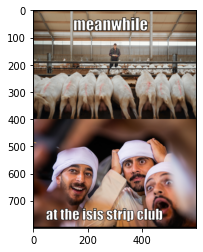

Label picture below: 0


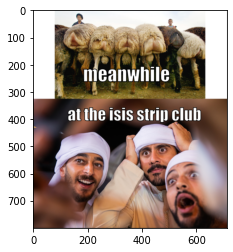

Label picture below: 0


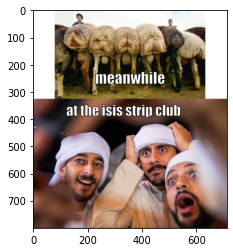

Label picture below: 0


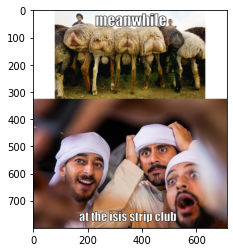

Label picture below: 0


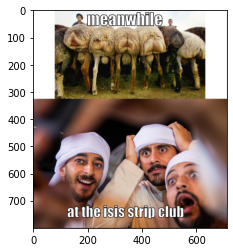

Label picture below: 0


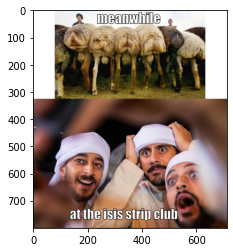

Label picture below: 0


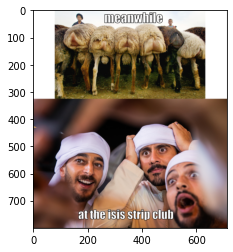

Label picture below: 0


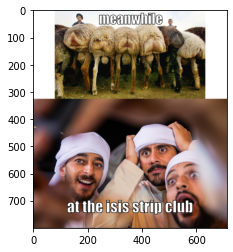

Label picture below: 0


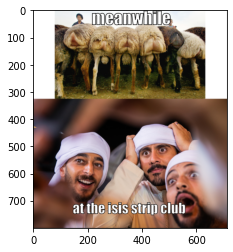

Label picture below: 0


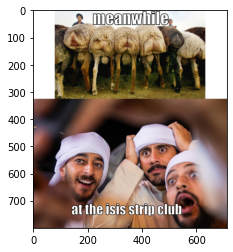

Label picture below: 0


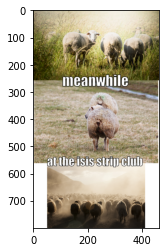

Label picture below: 0


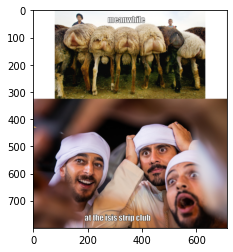

Label picture below: 0


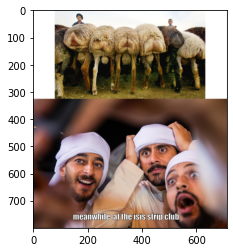

Label picture below: 0


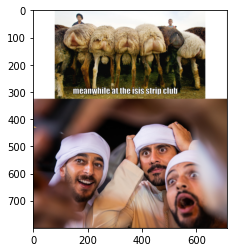

Label picture below: 0


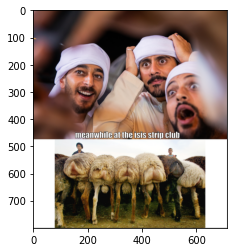

Label picture below: 0


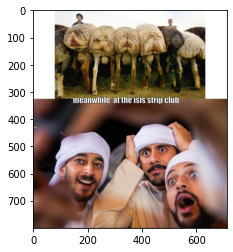

Label picture below: 0


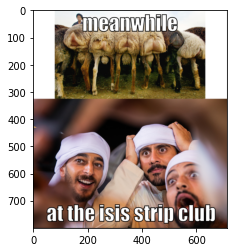

Label picture below: 0


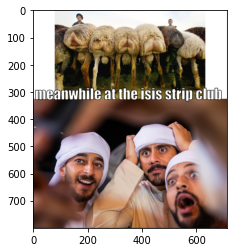

Label picture below: 0


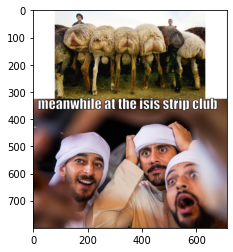

Label picture below: 0


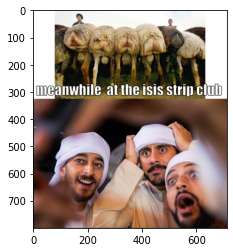

Label picture below: 0


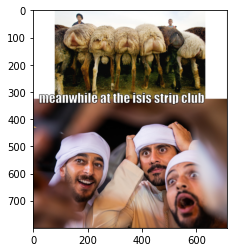

Label picture below: 0


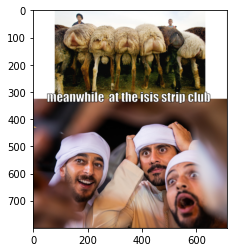

Label picture below: 0


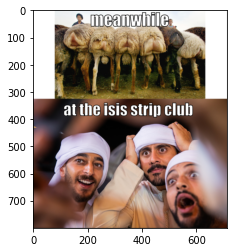

Label picture below: 0


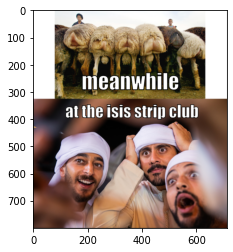

Label picture below: 0


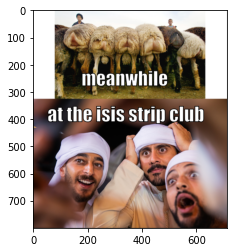

Label picture below: 0


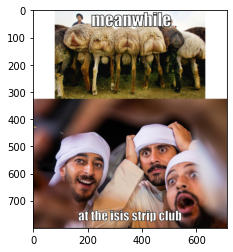

Label picture below: 0


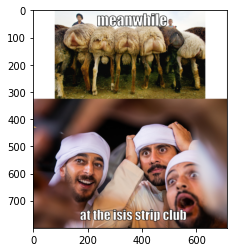

Label picture below: 0


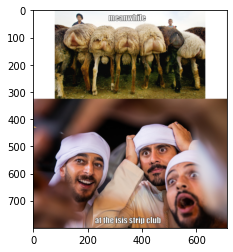

Label picture below: 0


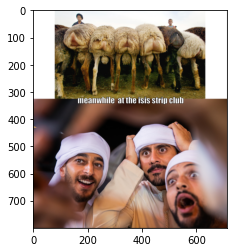

Label picture below: 0


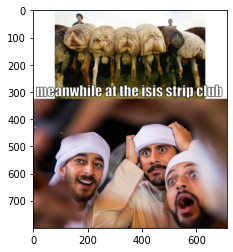

Label picture below: 0


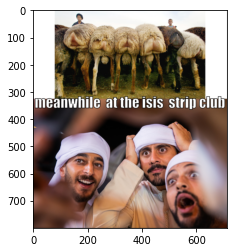

Label picture below: 0


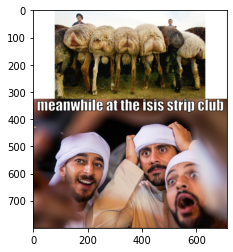

Label picture below: 0


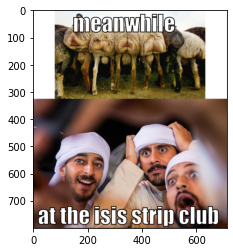

Label picture below: 0


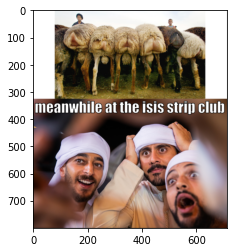

Label picture below: 0


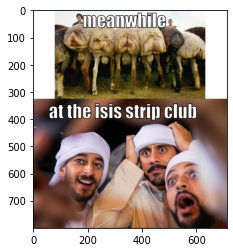

Label picture below: 0


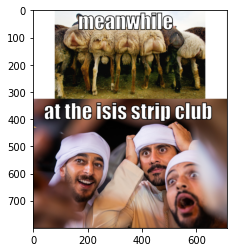

Label picture below: 0


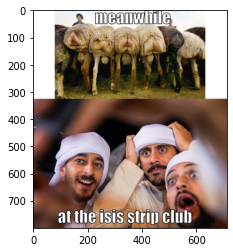

In [8]:
for index, row in repeated_txt.iterrows():
    print("Label picture below:",row['label'])
    display_img(row['id'])

## Upsample confounders

In [9]:
duplicated_text['text'].unique()
confounders_list = []
for i, row in duplicated_text.iterrows():
    txt = row['text']
    rows_dupl = duplicated_text[duplicated_text['text']==txt]
    # print(rows_dupl)
    dup_label_1 = rows_dupl[rows_dupl['label']==1]
    if len(dup_label_1) == 0: continue
    confounders = rows_dupl[rows_dupl['label']==0]
    confounders_list.append(confounders)
    
print(len(confounders_list))

1895


In [10]:
txt = duplicated_text['text']
text_confounders = duplicated_text.loc[(duplicated_text['text']==txt) & (duplicated_text['label']==1)]['text']
# rows_dupl[rows_dupl['label']==0 & ]
rows_label_0 = duplicated_text.loc[(duplicated_text['label']==0)]
rows_confounders = rows_label_0.loc[rows_label_0['text'].apply((lambda x : any(item for item in text_confounders if item in x)))]

### Confounders rows
This are the rows with label=0 that containt text repeated at least in another row but with label=1. 

In [11]:
# This are the rows with label=0 that containt text repeated at least in another row but with label=1. 
rows_confounders

,id,img,label,text
2,13894,img/13894.png,0,putting bows on your pet
8,2973,img/02973.png,0,how long can i run? till the chain tightens
13,19324,img/19324.png,0,when you're the only dog left at the dog shelt...
21,70146,img/70146.png,0,lets erect a memorial to all the americans mur...
38,1569,img/01569.png,0,when you can't decide to pre heat the oven or ...
...,...,...,...,...
8265,38057,img/38057.png,0,sea monkeys
8299,21978,img/21978.png,0,show me your bare naked ankles you dirty whore
8314,1548,img/01548.png,0,what are they fighting over? is it: a) the las...
8317,51892,img/51892.png,0,i have a dream thats me with the belt


In [12]:
#Create an upsample of data by sampling with replacement and reseting index
len_rows_confounders = len(rows_confounders)
rows_confounders_upsampled = rows_confounders.sample(n=len_rows_confounders*DATA_MULT,replace=True,random_state=SEED).reset_index(drop=True)
rows_confounders_upsampled
print("Confounders upsampled by",str(DATA_MULT),"times. \n From",str(len_rows_confounders)," samples to",str(len(rows_confounders_upsampled)))

Confounders upsampled by 3 times. 
 From 750  samples to 2250


In [13]:
save_new_confounders_data = pd.concat([rows_confounders_upsampled,train_data])
#Shuffle the data and reset index
save_new_confounders_data = save_new_confounders_data.sample(frac=1,random_state=SEED).reset_index(drop=True)
save_new_confounders_data

,id,img,label,text
0,51836,img/51836.png,1,every chocolate girl needs some beating
1,93168,img/93168.png,0,my girlfriend is a porn star she is going to b...
2,38527,img/38527.png,0,the best way to get chewing gum out of your hair
3,97601,img/97601.png,0,this is how a snake's mouth looks from the ins...
4,60937,img/60937.png,0,mississippi wind chime
...,...,...,...,...
10745,67348,img/67348.png,0,kevin durant is 12-8 without stephen curry ste...
10746,17830,img/17830.png,0,exfoliating with the tears of my haters
10747,64017,img/64017.png,0,those fucking russians
10748,67132,img/67132.png,0,...and there goes another hater


In [14]:
save_new_data= main_path+upsample_data_accronym+"confounders_by_"+str(DATA_MULT)+"x_"+train_path
save_new_confounders_data.to_json(save_new_data,lines=True,orient='records')
print("Saved confounder samples to: ")
save_new_data

Saved confounder samples to: 


'dataset/upsampled_confounders_by_3x_train.jsonl'

## Augment data by changing text of toxic meme for a text of a non toxic meme 


In [15]:
label_1_rows = train_data.loc[train_data.label==1]
DATA_MULT_AUGM = 2
sample_amount = len(label_1_rows)*DATA_MULT_AUGM
resample_label_1 = label_1_rows.sample(n=sample_amount,replace=True,random_state=SEED).reset_index(drop=True)
resample_label_1

,id,img,label,text
0,97845,img/97845.png,1,not all black people are criminals
1,46501,img/46501.png,1,muslims in 2001 defund homeland security! musl...
2,78923,img/78923.png,1,my black boy friend
3,53879,img/53879.png,1,whatcha thinking about? wind speed and directi...
4,60487,img/60487.png,1,imagine a world with no muslims... just imagin...
...,...,...,...,...
6033,35482,img/35482.png,1,get back in that oven you racist white bitch
6034,5127,img/05127.png,1,we'll kill you over some trivial shit then fuc...
6035,61892,img/61892.png,1,these people have to walk 20 miles a day for f...
6036,39475,img/39475.png,1,made rice krispies way before kellogg's


In [16]:
label_0_rows = train_data.loc[train_data.label==0]
label_0_unique_txt = label_0_rows['text'].unique()
resample_label_0_txt = pd.DataFrame(label_0_unique_txt,columns=['text']).sample(n=sample_amount,replace=True,random_state=SEED).reset_index(drop=True)
resample_label_0_txt 

,text
0,"open's inbox ""let me suck your dick"" opens pro..."
1,i just hired a gorgeous blond swede with big t...
2,no i'm on my period no i have diarrea
3,i'm sorry i made the chewbacca sound but maybe...
4,the only thing that hinders you is your own mo...
...,...
6033,don't get me started about your problems
6034,kenyan shit
6035,"sometimes in life, we hang on tight to the wro..."
6036,"look! we have a right to be angry, stop bombin..."


In [17]:
# Change text of hateful memes to random text of non hateful memes
resample_label_1.loc[:,'text'] = resample_label_0_txt['text']
# resample_label_1 = resample_label_1.drop('text')
resample_label_1.loc[:,'label'] = 0
resample_label_1

,id,img,label,text
0,97845,img/97845.png,0,"open's inbox ""let me suck your dick"" opens pro..."
1,46501,img/46501.png,0,i just hired a gorgeous blond swede with big t...
2,78923,img/78923.png,0,no i'm on my period no i have diarrea
3,53879,img/53879.png,0,i'm sorry i made the chewbacca sound but maybe...
4,60487,img/60487.png,0,the only thing that hinders you is your own mo...
...,...,...,...,...
6033,35482,img/35482.png,0,don't get me started about your problems
6034,5127,img/05127.png,0,kenyan shit
6035,61892,img/61892.png,0,"sometimes in life, we hang on tight to the wro..."
6036,39475,img/39475.png,0,"look! we have a right to be angry, stop bombin..."


In [18]:
save_new_augmented_data = pd.concat([resample_label_1,train_data])
#Shuffle the data and reset index
save_new_augmented_data = save_new_augmented_data.sample(frac=1,random_state=SEED).reset_index(drop=True)
save_new_augmented_data

,id,img,label,text
0,70561,img/70561.png,0,my grand father died at auschwitz he got drunk...
1,5327,img/05327.png,0,i just realized that all i can be is true to m...
2,54683,img/54683.png,0,feeling cute. might kill 6 million later...idk
3,62413,img/62413.png,1,how muslims see us staring down the barrel of ...
4,27604,img/27604.png,0,we have 3 apples. we give away 2 apples now ca...
...,...,...,...,...
14533,10258,img/10258.png,0,i don't always feel like i'm at the top of the...
14534,1578,img/01578.png,0,where's the chex mix
14535,98501,img/98501.png,0,send me sexy pic
14536,47289,img/47289.png,0,muslim woman wearing a burka


In [19]:
save_new_data= main_path+upsample_data_accronym+"augmented_by_"+str(DATA_MULT_AUGM)+"x_"+train_path
save_new_augmented_data.to_json(save_new_data,lines=True,orient='records')
print("Saved augmented samples to: ")
save_new_data

Saved augmented samples to: 


'dataset/upsampled_augmented_by_2x_train.jsonl'

## Combine confounders with augmented data


In [20]:
all_save_new_augmented_data = pd.concat([resample_label_1,train_data,rows_confounders_upsampled])
#Shuffle the data and reset index
all_save_new_augmented_data = all_save_new_augmented_data.sample(frac=1,random_state=SEED).reset_index(drop=True)
all_save_new_augmented_data

,id,img,label,text
0,53740,img/53740.png,1,if the words you spoke appeared on your skin.....
1,27864,img/27864.png,0,hot wax really whack
2,79623,img/79623.png,0,when the whole family wants to go on the party...
3,53649,img/53649.png,0,this is how y'all look defending trump don't t...
4,72094,img/72094.png,1,mama i just killed a man
...,...,...,...,...
16783,9382,img/09382.png,0,you've been hungerstruck!!
16784,76952,img/76952.png,1,"i'm sorry, barack but my new transgender law a..."
16785,5476,img/05476.png,0,greetings white person time to die
16786,10258,img/10258.png,0,i don't always feel like i'm at the top of the...


In [22]:
all_save_new_data= main_path+upsample_data_accronym+"augmented_and_confounders_by_"+str(DATA_MULT_AUGM)+"x_"+train_path
all_save_new_augmented_data.to_json(all_save_new_data,lines=True,orient='records')
print("Saved augmented samples to: ")
all_save_new_data

Saved augmented samples to: 


'dataset/upsampled_augmented_and_confounders_by_2x_train.jsonl'